# Disentanglix development

## Testing with real data

In [1]:
import autoencodix as acx
from autoencodix.data.datapackage import DataPackage
from autoencodix.utils.default_config import DataCase
from autoencodix.utils.default_config import DefaultConfig
import pandas as pd

df_rna = pd.read_parquet("./input_data_test/combined_rnaseq_formatted.parquet")
df_meth = pd.read_parquet("./input_data_test/combined_meth_formatted.parquet")
df_anno = pd.read_parquet("./input_data_test/combined_clin_formatted.parquet")

data_package = DataPackage()
data_package.multi_bulk = {"transcriptomics": df_rna, "epigenetic": df_meth}
data_package.annotation = {
	"paired": df_anno.copy(),
}


my_cfg = DefaultConfig(
	data_case=DataCase.MULTI_BULK,
	loss_reduction="sum",
	k_filter=2000,
	latent_dim=2,
	scaling="STANDARD",
	filtering="VAR",
	epochs=500,
	learning_rate=0.0001,
	batch_size = 128,
	beta_mi = 1,
	beta_tc = 3000,
	beta_dimKL= 0.5,
	use_mss = True,
	drop_p =0.1,
	global_seed=42,
	checkpoint_interval=1,
	n_layers=1)

/home/ewald/Github/autoencodix_package/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
disent = acx.Disentanglix(data=data_package, config=my_cfg)


in handle_direct_user_data with data: <class 'autoencodix.data.datapackage.DataPackage'>


In [3]:
disent.run()

 n_samples: {'multi_sc': {'multi_sc': 0}, 'multi_bulk': {'transcriptomics': 3529, 'epigenetic': 3529}, 'annotation': {'paired': 3529}, 'img': {'img': 0}, 'from_modality': {}, 'to_modality': {}, 'paired_count': {'paired_count': 3529}}
cur shape: transcriptomics: (2470, 1000)
cur shape: epigenetic: (2470, 1000)
cur shape: transcriptomics: (706, 1000)
cur shape: epigenetic: (706, 1000)
cur shape: transcriptomics: (353, 1000)
cur shape: epigenetic: (353, 1000)
Epoch 1/500 - Train Loss: 5501702.9062
Sub-losses: recon_loss: 5501699.6562, mut_info_loss: 0.0715, tot_corr_loss: 3.0665, dimwise_kl_loss: 0.1784, anneal_factor: 0.0000, effective_beta_mi_factor: 0.0000, effective_beta_tc_factor: 0.1362, effective_beta_dimKL_factor: 0.0000
Epoch 1/500 - Valid Loss: 697496.2031
Sub-losses: recon_loss: 697495.8281, mut_info_loss: 0.0152, tot_corr_loss: 0.2705, dimwise_kl_loss: 0.0878, anneal_factor: 0.0000, effective_beta_mi_factor: 0.0000, effective_beta_tc_factor: 0.1362, effective_beta_dimKL_factor

Result Object Public Attributes:
------------------------------
latentspaces: TrainingDynamics object
sample_ids: TrainingDynamics object
reconstructions: TrainingDynamics object
mus: TrainingDynamics object
sigmas: TrainingDynamics object
losses: TrainingDynamics object
sub_losses: LossRegistry(_losses={'recon_loss': TrainingDynamics(), 'mut_info_loss': TrainingDynamics(), 'tot_corr_loss': TrainingDynamics(), 'dimwise_kl_loss': TrainingDynamics(), 'anneal_factor': TrainingDynamics(), 'effective_beta_mi_factor': TrainingDynamics(), 'effective_beta_tc_factor': TrainingDynamics(), 'effective_beta_dimKL_factor': TrainingDynamics()})
preprocessed_data: Tensor of shape (0,)
model: VarixArchitecture
model_checkpoints: TrainingDynamics object
datasets: DatasetContainer(train=<autoencodix.data._numeric_dataset.NumericDataset object at 0x79e4f7bc3a60>, valid=<autoencodix.data._numeric_dataset.NumericDataset object at 0x79e6116e34c0>, test=<autoencodix.data._numeric_dataset.NumericDataset object

Creating plots ...


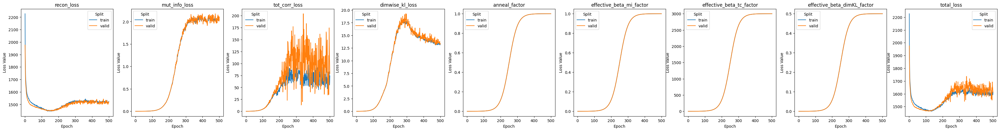

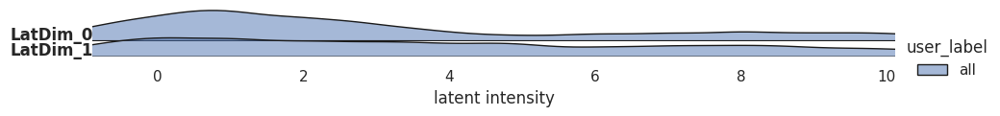

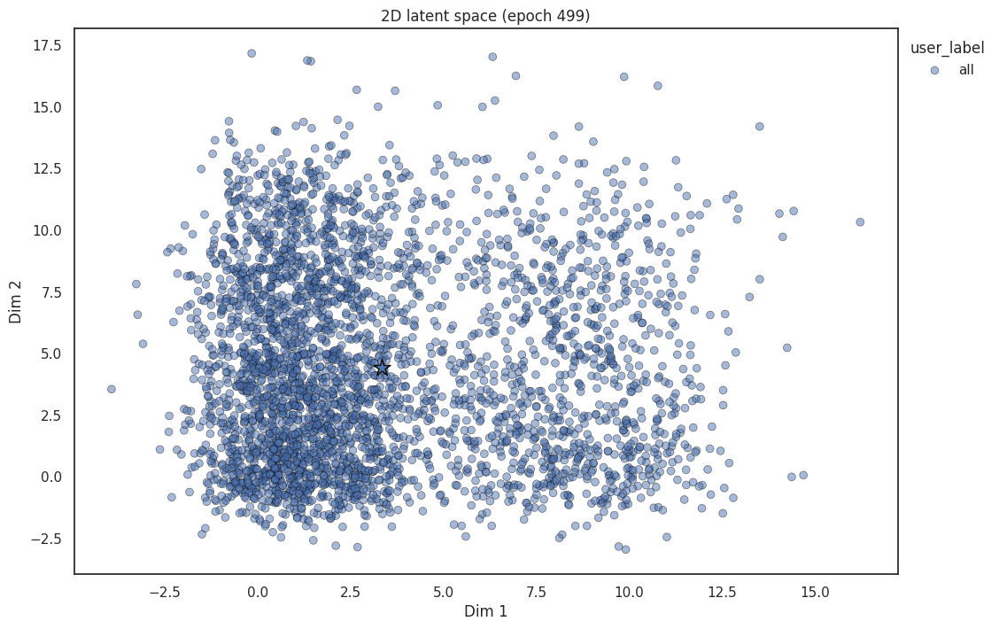

In [4]:
disent.show_result()

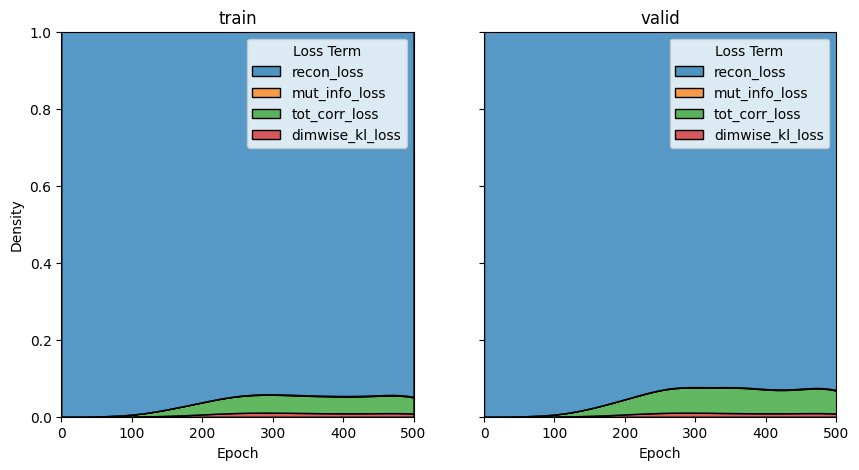

In [5]:
disent._visualizer.show_loss(plot_type="relative")

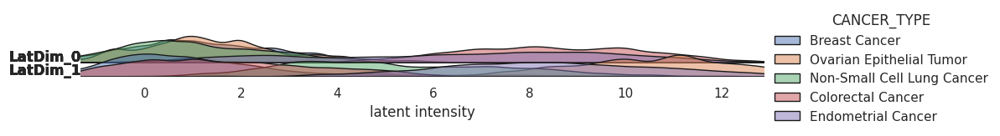

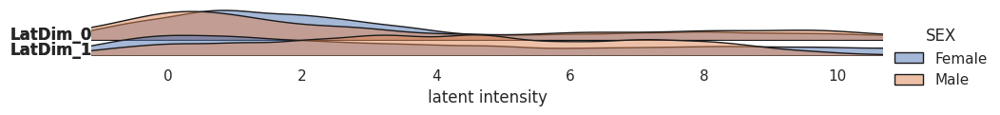

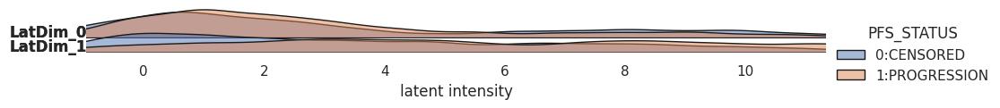

In [6]:
disent._visualizer.show_latent_space(result=disent.result, plot_type="Ridgeline", param=["CANCER_TYPE","SEX","PFS_STATUS"])

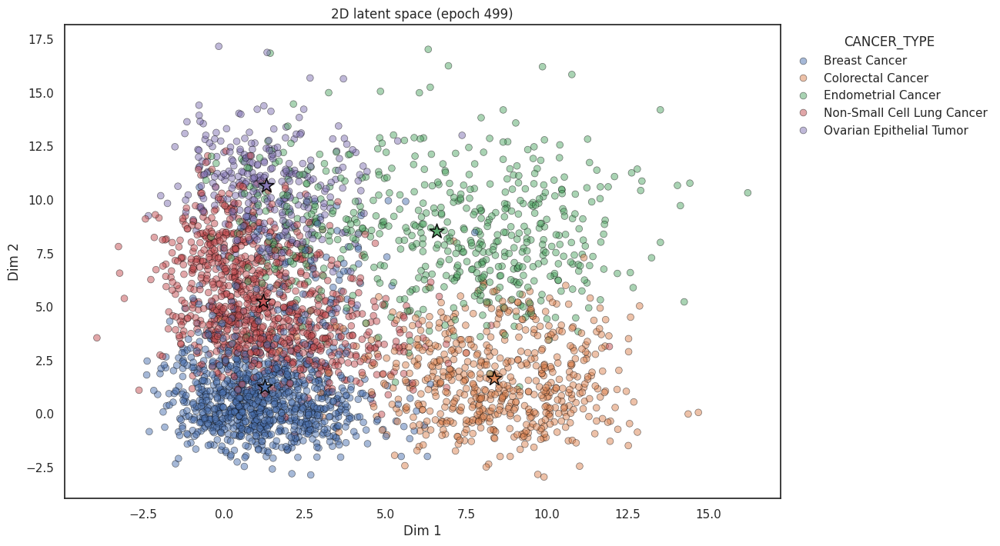

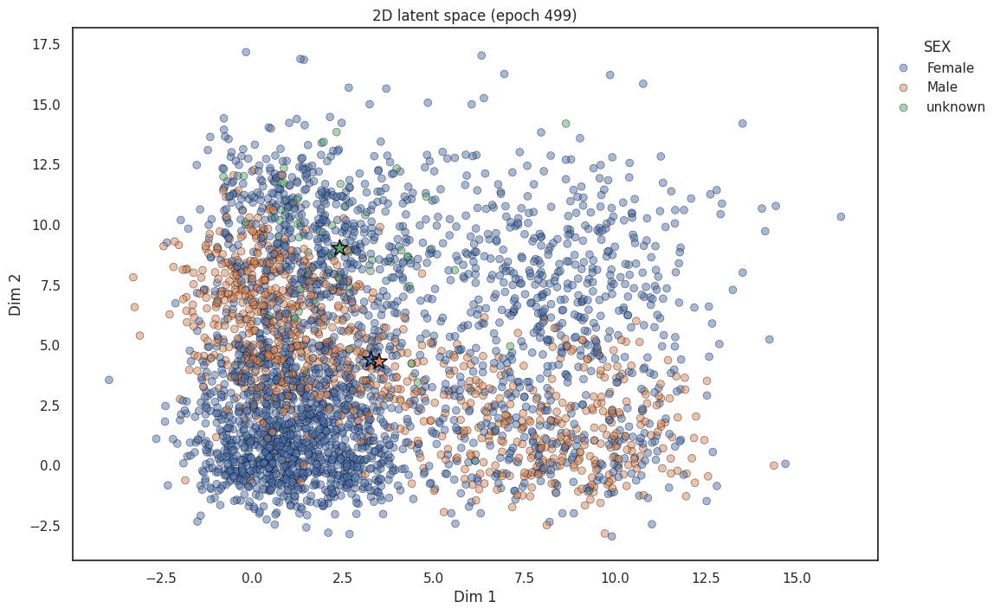

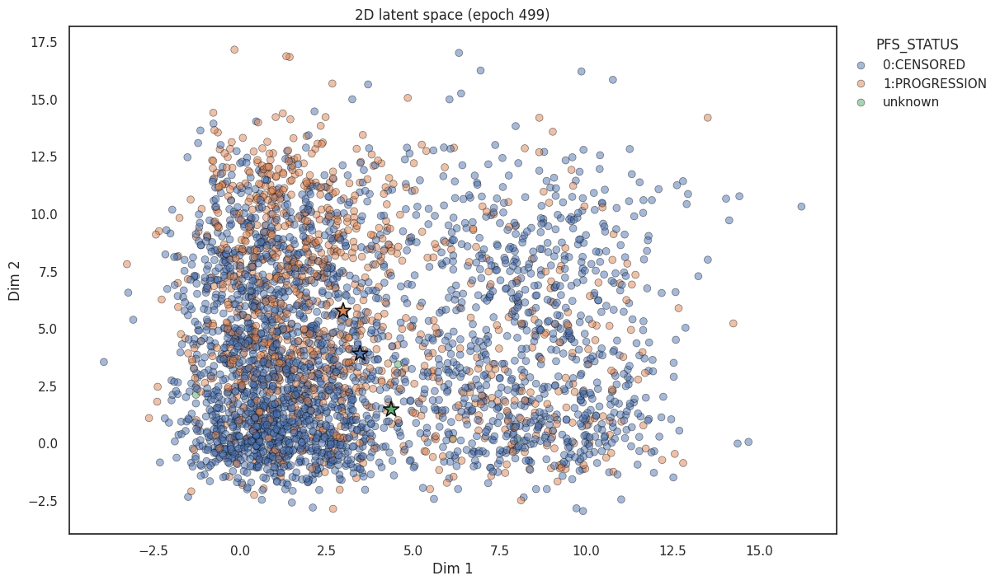

In [7]:
disent._visualizer.show_latent_space(result=disent.result, plot_type="2D-scatter", param=["CANCER_TYPE","SEX","PFS_STATUS"])

The provided label column is numeric and converted to categories.


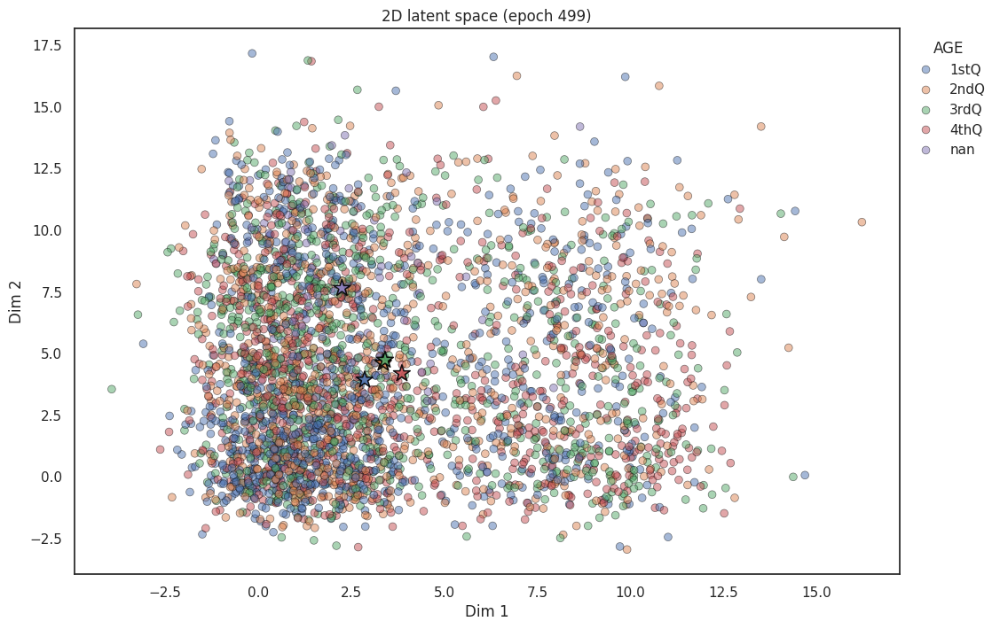

The provided label column is numeric and converted to categories.


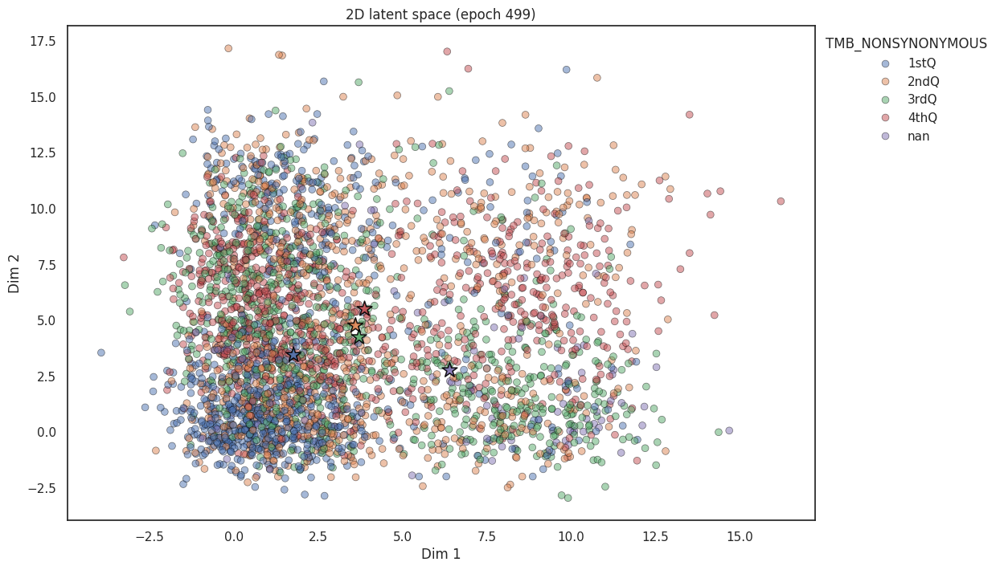

The provided label column is numeric and converted to categories.


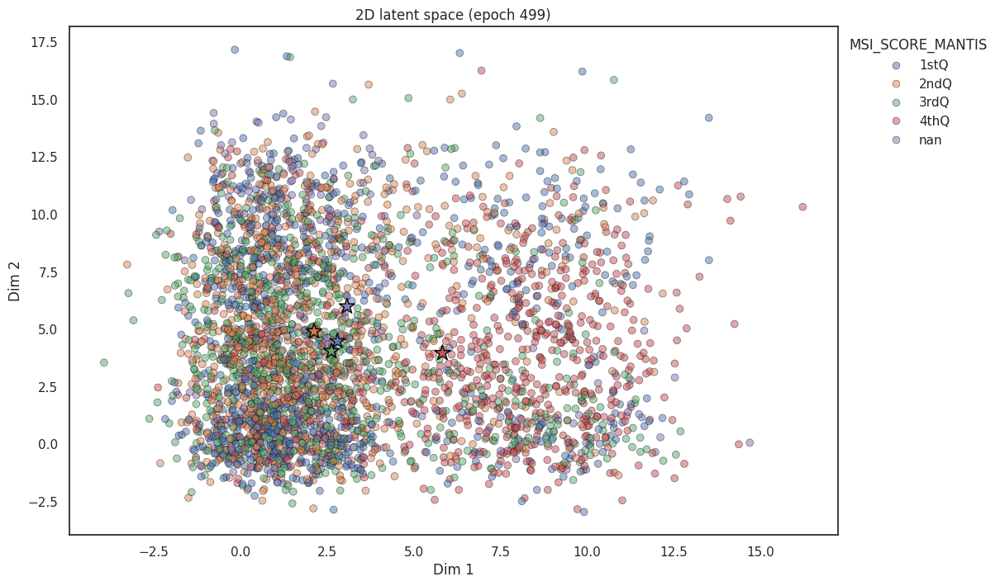

In [8]:
disent._visualizer.show_latent_space(result=disent.result, plot_type="2D-scatter", param=["AGE","TMB_NONSYNONYMOUS", "MSI_SCORE_MANTIS"])

## Train a Varix for comparison

in handle_direct_user_data with data: <class 'autoencodix.data.datapackage.DataPackage'>
 n_samples: {'multi_sc': {'multi_sc': 0}, 'multi_bulk': {'transcriptomics': 3529, 'epigenetic': 3529}, 'annotation': {'paired': 3529}, 'img': {'img': 0}, 'from_modality': {}, 'to_modality': {}, 'paired_count': {'paired_count': 3529}}
cur shape: transcriptomics: (2470, 1000)
cur shape: epigenetic: (2470, 1000)
cur shape: transcriptomics: (706, 1000)
cur shape: epigenetic: (706, 1000)
cur shape: transcriptomics: (353, 1000)
cur shape: epigenetic: (353, 1000)
Epoch 1/500 - Train Loss: 5577184.2734
Sub-losses: recon_loss: 5577184.0469, var_loss: 0.3288, anneal_factor: 0.0000, effective_beta_factor: 0.0000
Epoch 1/500 - Valid Loss: 720088.9844
Sub-losses: recon_loss: 720088.8594, var_loss: 0.1193, anneal_factor: 0.0000, effective_beta_factor: 0.0000
Epoch 2/500 - Train Loss: 4935790.8828
Sub-losses: recon_loss: 4935789.5234, var_loss: 1.3716, anneal_factor: 0.0000, effective_beta_factor: 0.0000
Epoch 2/

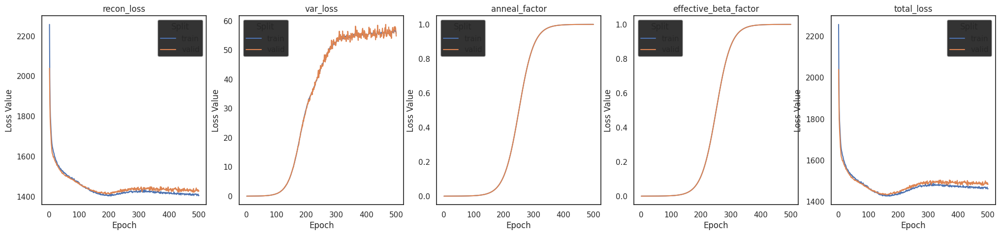

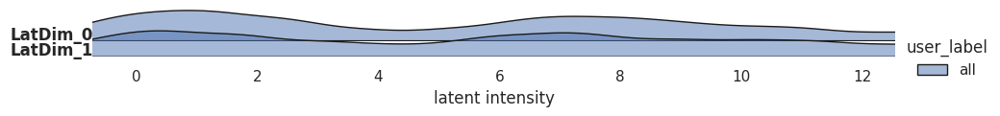

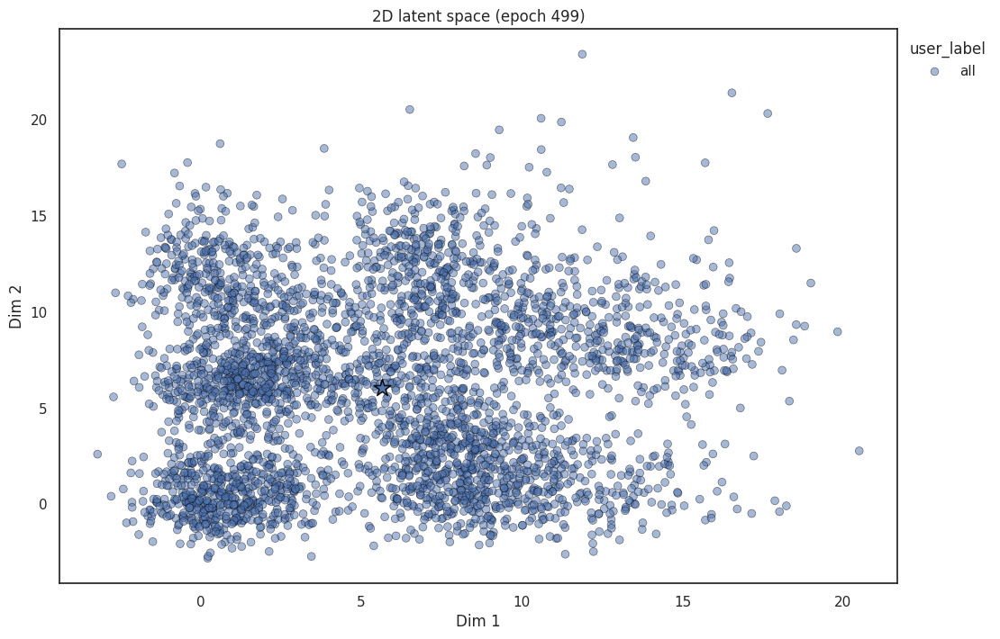

In [9]:
## Varix for comparison
my_cfg.beta = 0.1*10
varix = acx.Varix(data=data_package, config=my_cfg)
varix.run()
varix.show_result()

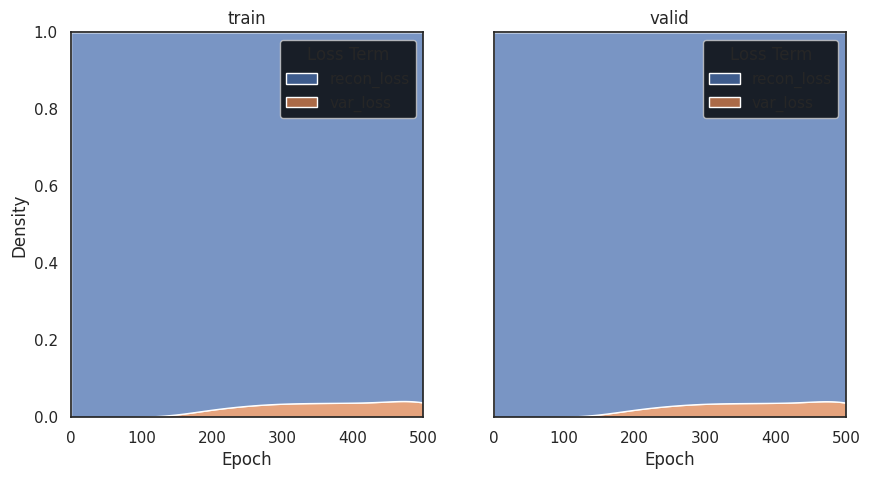

In [10]:
varix._visualizer.show_loss(plot_type="relative")

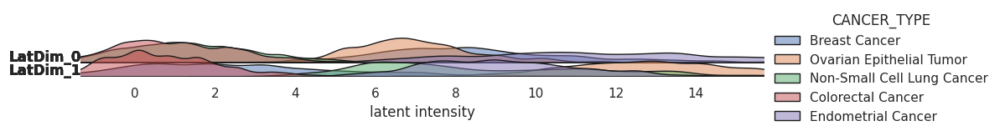

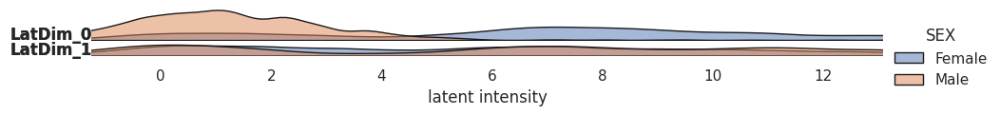

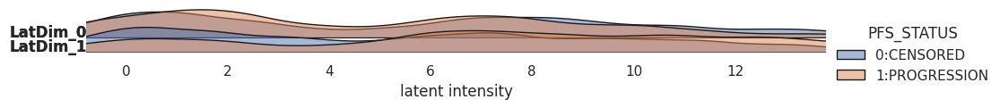

In [11]:
varix._visualizer.show_latent_space(result=varix.result, plot_type="Ridgeline", param=["CANCER_TYPE","SEX","PFS_STATUS"])

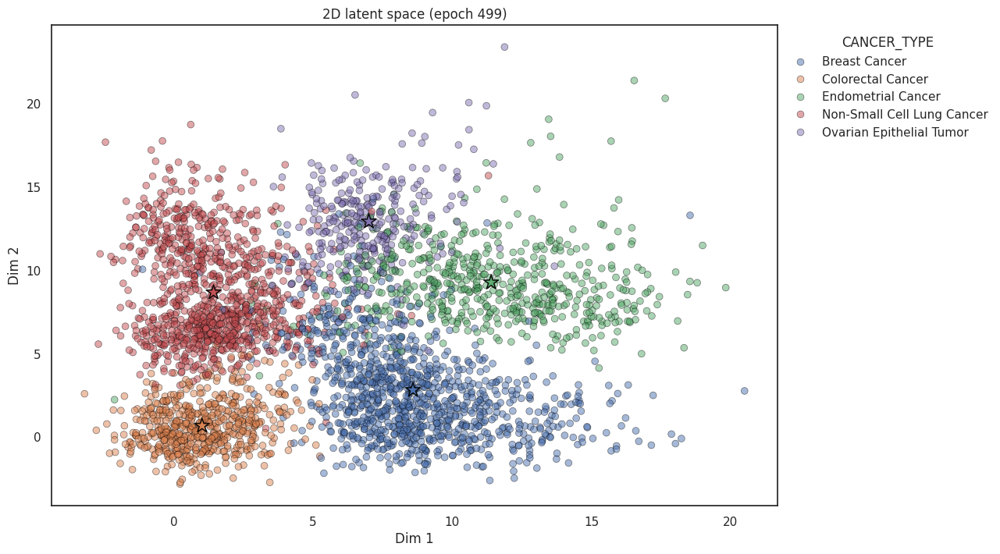

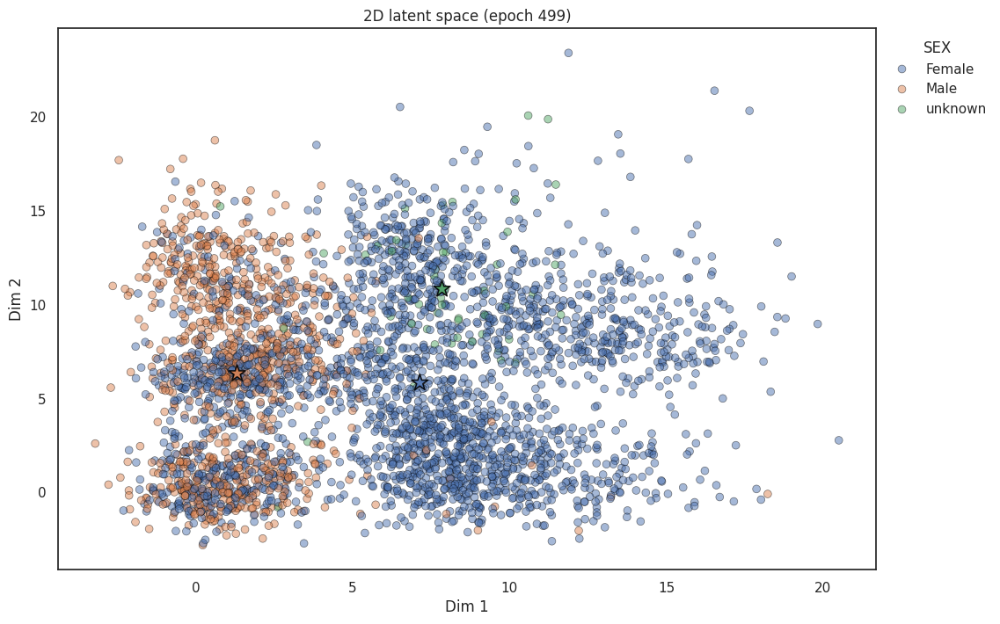

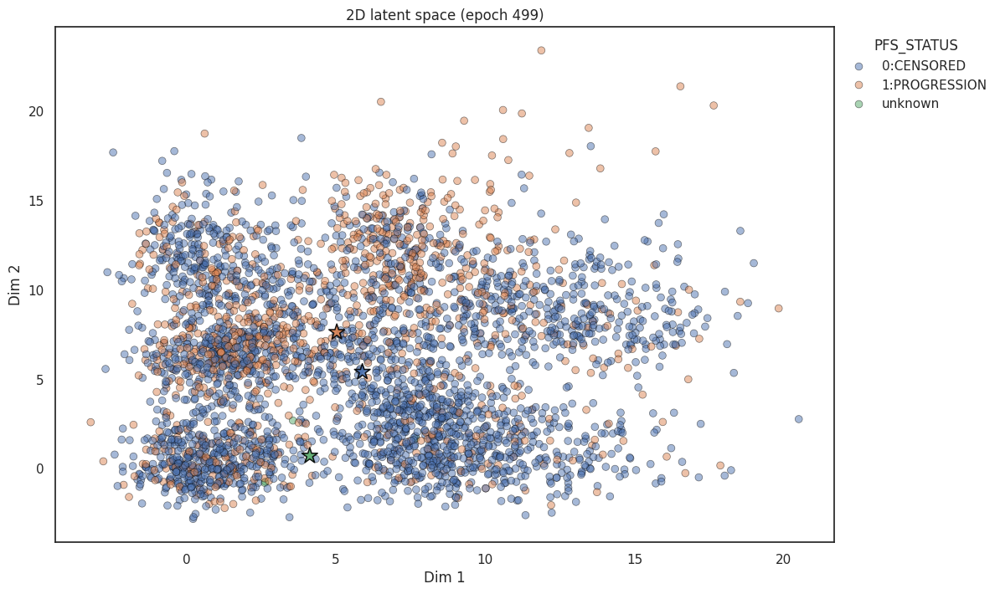

In [12]:
varix._visualizer.show_latent_space(result=varix.result, plot_type="2D-scatter", param=["CANCER_TYPE","SEX","PFS_STATUS"])

The provided label column is numeric and converted to categories.


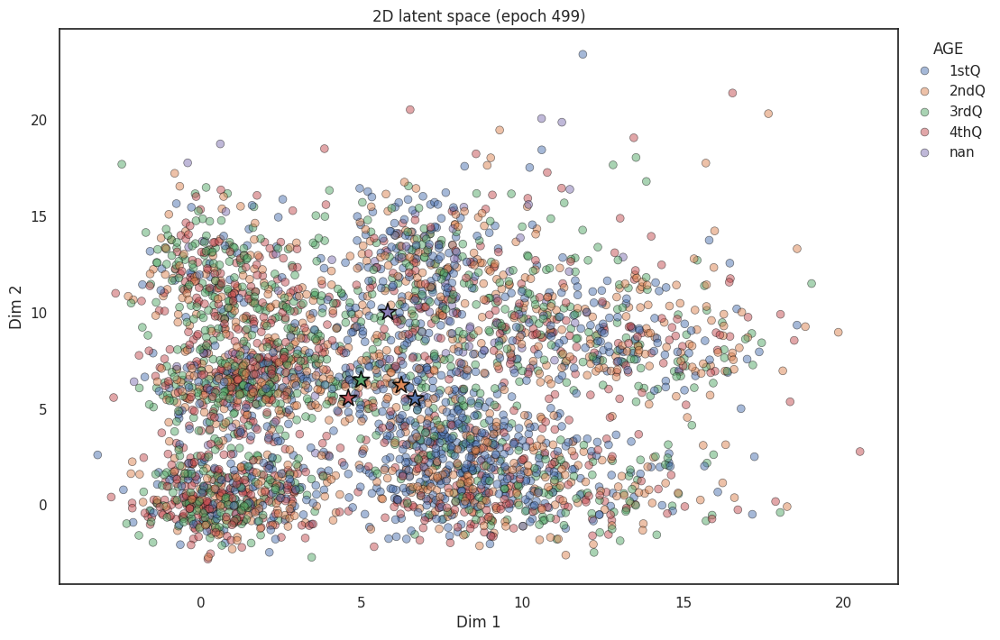

The provided label column is numeric and converted to categories.


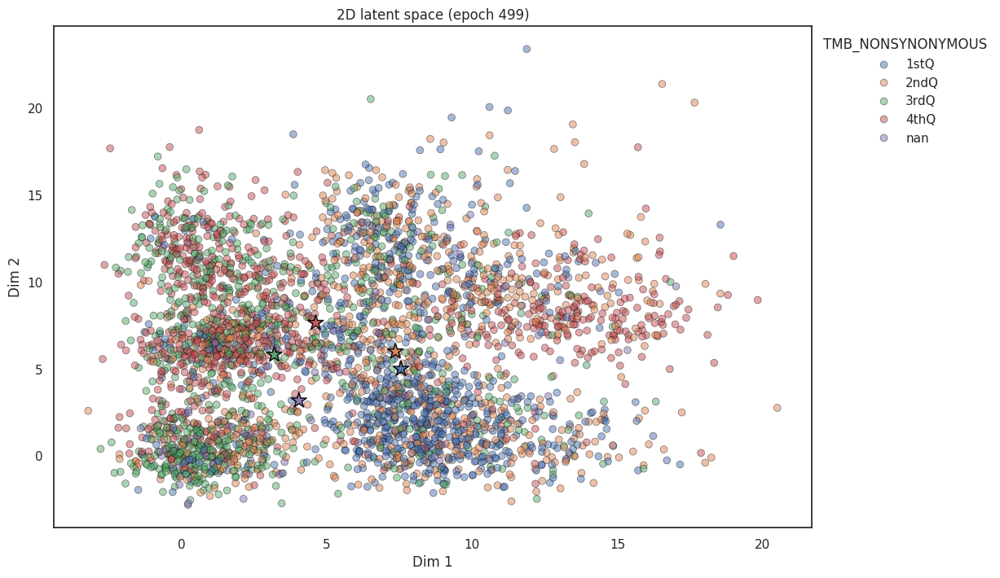

The provided label column is numeric and converted to categories.


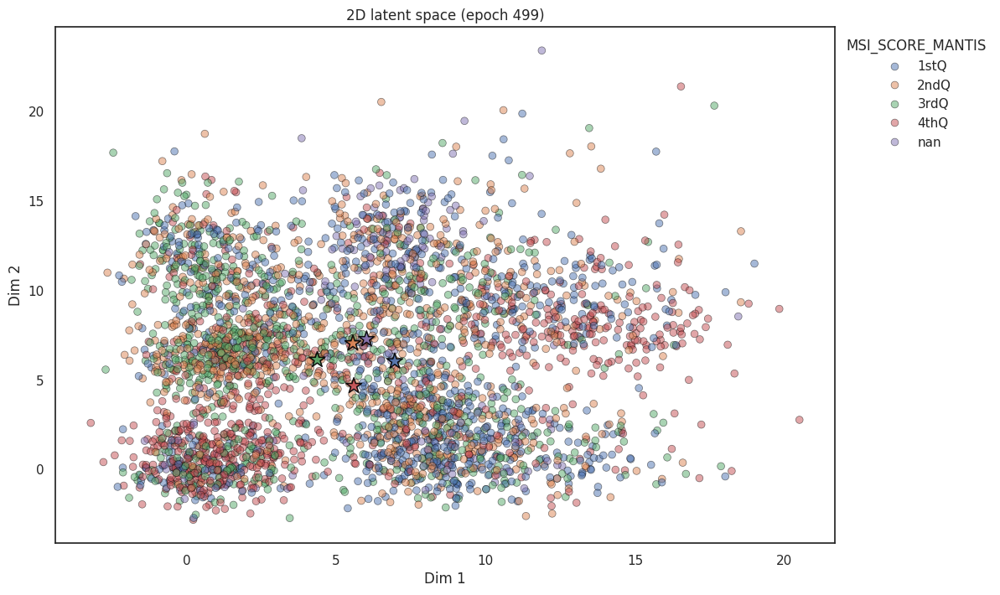

In [13]:
varix._visualizer.show_latent_space(result=varix.result, plot_type="2D-scatter", param=["AGE","TMB_NONSYNONYMOUS", "MSI_SCORE_MANTIS"])

## Comparison to PCA

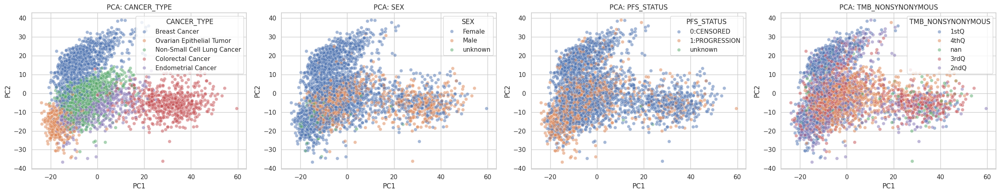

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
sns.set(style="whitegrid")

# Prepare annotation dataframe
anno_df = pd.concat([
	disent._datasets.train.metadata['paired'],
	disent._datasets.test.metadata['paired'],
	disent._datasets.valid.metadata['paired']
])


data_df = pd.concat([
	disent._datasets.train._to_df(),
	disent._datasets.test._to_df(),
	disent._datasets.valid._to_df()
])
# Join data and annotation



pca = PCA(n_components=2)
X_pca = pca.fit_transform(data_df)

df_all = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_all['CANCER_TYPE'] = anno_df.loc[data_df.index,'CANCER_TYPE'].values
df_all['SEX'] = anno_df.loc[data_df.index,'SEX'].values
df_all['PFS_STATUS'] = anno_df.loc[data_df.index,'PFS_STATUS'].values
tmb_groups = pd.qcut(x=anno_df.loc[data_df.index, 'TMB_NONSYNONYMOUS' ],
                        q=4,
                        labels=["1stQ", "2ndQ", "3rdQ", "4thQ"],
                    ).astype(str).to_list()
df_all['TMB_NONSYNONYMOUS'] = tmb_groups

# Plot for each parameter
params = ['CANCER_TYPE', 'SEX', 'PFS_STATUS', 'TMB_NONSYNONYMOUS']
fig, axes = plt.subplots(1, 4, figsize=(25, 5))
for i, param in enumerate(params):
	ax = axes[i]
	# scatter = ax.scatter(df_all['PC1'], df_all['PC2'], c=pd.factorize(df_all[param])[0], alpha=0.5, cmap='tab10')
	scatter = sns.scatterplot(x='PC1', y='PC2', hue=param, data=df_all, ax=ax, alpha=0.5)
	ax.set_title(f'PCA: {param}')
	ax.set_xlabel('PC1')
	ax.set_ylabel('PC2')
	legend_labels = df_all[param].unique()
	# ax.legend(handles=scatter.legend_elements()[0], labels=legend_labels.tolist(), title=param)
plt.tight_layout()
plt.show()

## Coverage and total correlation plot

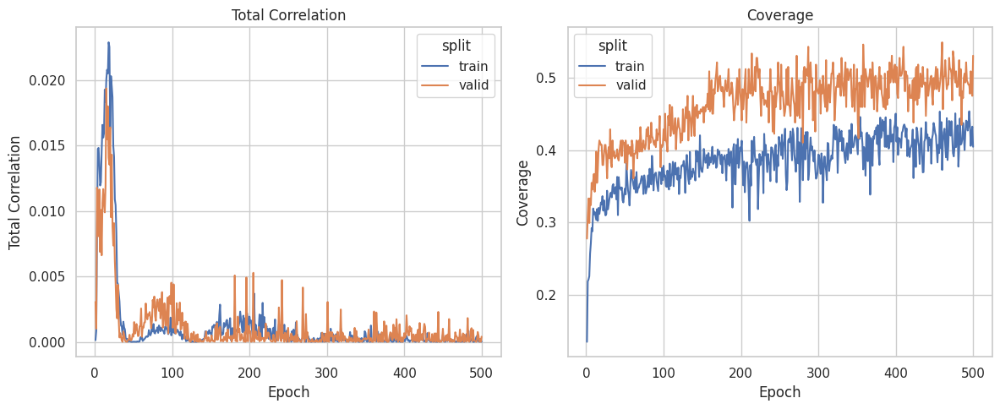

In [17]:
disent._visualizer.show_latent_space(plot_type="Coverage-Correlation", result=disent.result)

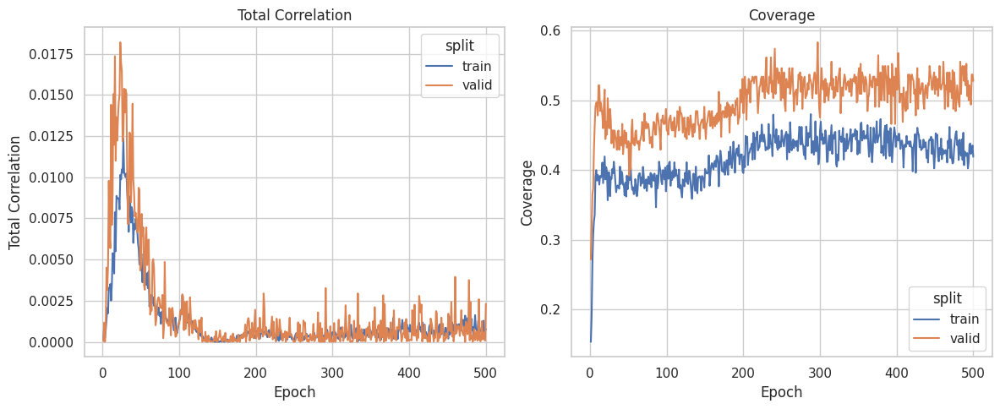

In [18]:
varix._visualizer.show_latent_space(plot_type="Coverage-Correlation", result=varix.result)